# End-to-end machine learning project working with Boston Housing dataset.

This project will follow the 8  steps outlined below. Dataset was chosen to model the project from Chapter 2 and imported from the sklearn library.

1. Looking at the big picture
2. Getting the data 
3. Discovering and visualizing the data to gain insights (EDA)
4. Preparing the data for Machine Learning algorithms 
5. Selecting a model and training it 
6. Fine-tuning model 
7. Presentiing solution 
8. Launching, monitoring, and maintaining the system

 ## 1. Looking at the big picture 

### What is the business objective? 

#### What performance measure am I using? 
    1. MSE 
    2. RSME 
    3. Decision Tree Regressor 
    4. Ramdon Forest Regressor 

# Define business objective 

The purpose of project is to predict the median value of prices of houses in the Boston area, using features provided from the dataset. 

## 2. Getting the data

In [1]:
# importing necessary libraries and modules 

import numpy as np
import matplotlib.pyplot as plt 

import pandas as pd  
import seaborn as sns 

%matplotlib inline


In [2]:
# importing data from sklearn  

from sklearn.datasets import load_boston
boston_dataset = load_boston()

In [3]:
# viewing already assigned dataset keys

print(boston_dataset.keys())

dict_keys(['data', 'target', 'feature_names', 'DESCR', 'filename'])


In [4]:
#feature names 
print(boston_dataset.feature_names)

['CRIM' 'ZN' 'INDUS' 'CHAS' 'NOX' 'RM' 'AGE' 'DIS' 'RAD' 'TAX' 'PTRATIO'
 'B' 'LSTAT']


In [5]:
#detailed info on dataset and feature values 
print(boston_dataset.DESCR)

.. _boston_dataset:

Boston house prices dataset
---------------------------

**Data Set Characteristics:**  

    :Number of Instances: 506 

    :Number of Attributes: 13 numeric/categorical predictive. Median Value (attribute 14) is usually the target.

    :Attribute Information (in order):
        - CRIM     per capita crime rate by town
        - ZN       proportion of residential land zoned for lots over 25,000 sq.ft.
        - INDUS    proportion of non-retail business acres per town
        - CHAS     Charles River dummy variable (= 1 if tract bounds river; 0 otherwise)
        - NOX      nitric oxides concentration (parts per 10 million)
        - RM       average number of rooms per dwelling
        - AGE      proportion of owner-occupied units built prior to 1940
        - DIS      weighted distances to five Boston employment centres
        - RAD      index of accessibility to radial highways
        - TAX      full-value property-tax rate per $10,000
        - PTRATIO  pu

In [6]:
#changing dataset into pandas df for rest of project 
#adding target variable to dataset 

boston = pd.DataFrame(data=boston_dataset.data, columns=boston_dataset.feature_names)
boston["MEDV"] = boston_dataset.target
boston.head(5)

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT,MEDV
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98,24.0
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14,21.6
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03,34.7
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94,33.4
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33,36.2


In [7]:
#double checking for null values 

boston.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 506 entries, 0 to 505
Data columns (total 14 columns):
 #   Column   Non-Null Count  Dtype  
---  ------   --------------  -----  
 0   CRIM     506 non-null    float64
 1   ZN       506 non-null    float64
 2   INDUS    506 non-null    float64
 3   CHAS     506 non-null    float64
 4   NOX      506 non-null    float64
 5   RM       506 non-null    float64
 6   AGE      506 non-null    float64
 7   DIS      506 non-null    float64
 8   RAD      506 non-null    float64
 9   TAX      506 non-null    float64
 10  PTRATIO  506 non-null    float64
 11  B        506 non-null    float64
 12  LSTAT    506 non-null    float64
 13  MEDV     506 non-null    float64
dtypes: float64(14)
memory usage: 55.5 KB


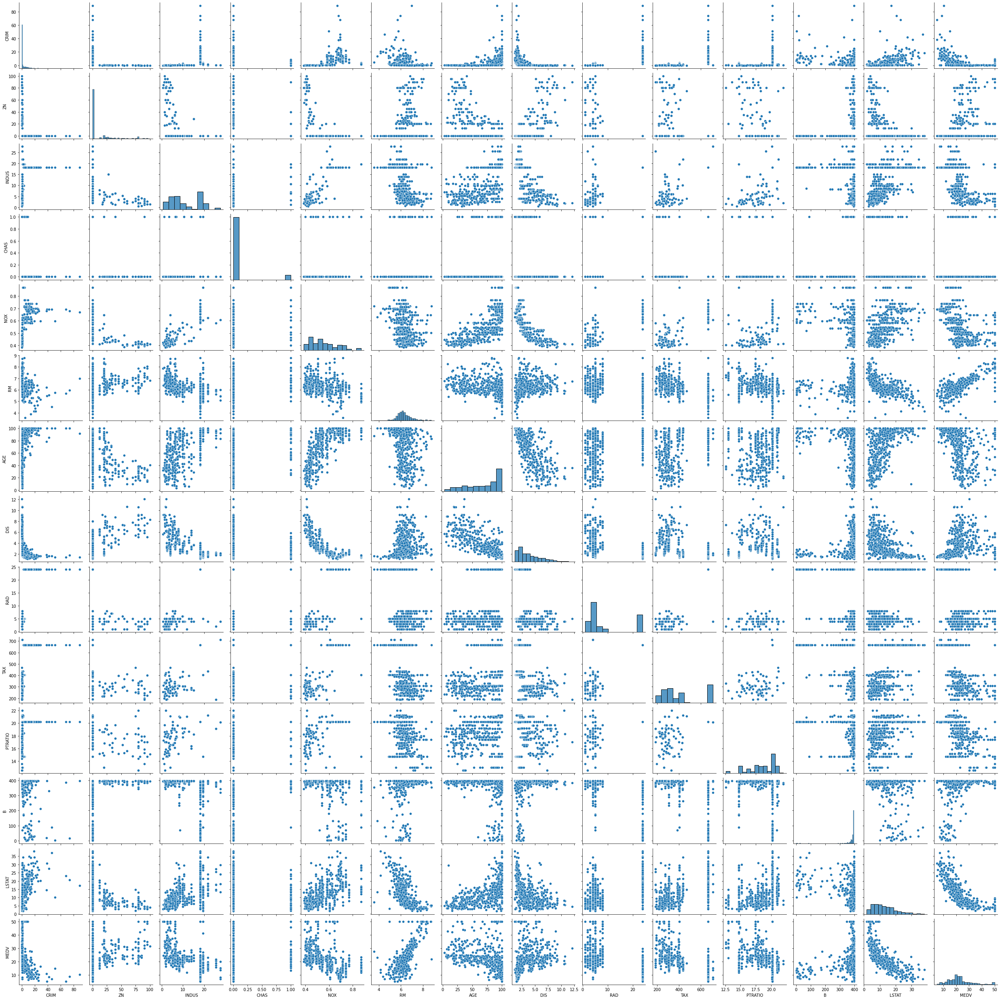

In [8]:
#plotting historgram for each numerical attribute 

import seaborn as sns 

sns.pairplot(boston)

/Users/ellabrucker/opt/anaconda3/lib/python3.8/site-packages/seaborn/distributions.py:2557: FutureWarning: `distplot` is a deprecated function and will be removed in a future version. Please adapt your code to use either `displot` (a figure-level function with similar flexibility) or `histplot` (an axes-level function for histograms).
  warnings.warn(msg, FutureWarning)


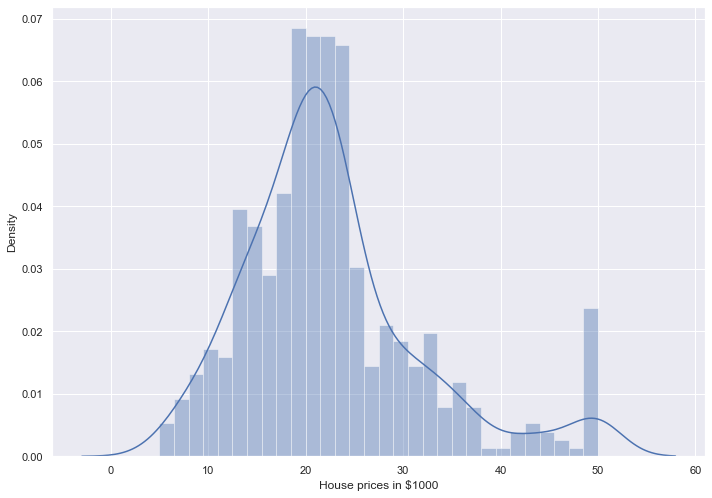

In [9]:
#plotting distribution of target variable (median value of homes)
sns.set(rc={'figure.figsize':(11.7,8.27)})
sns.distplot(boston['MEDV'], bins=30)
plt.xlabel("House prices in $1000")
plt.show()

In [10]:
# prices seem to be normally distributed. Maybe a couple outliers 

### Creating a test set 

In [11]:
#dropping predicted value 
boston_pred = boston.drop(['MEDV'], axis = 1)
boston_pred

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
0,0.00632,18.0,2.31,0.0,0.538,6.575,65.2,4.0900,1.0,296.0,15.3,396.90,4.98
1,0.02731,0.0,7.07,0.0,0.469,6.421,78.9,4.9671,2.0,242.0,17.8,396.90,9.14
2,0.02729,0.0,7.07,0.0,0.469,7.185,61.1,4.9671,2.0,242.0,17.8,392.83,4.03
3,0.03237,0.0,2.18,0.0,0.458,6.998,45.8,6.0622,3.0,222.0,18.7,394.63,2.94
4,0.06905,0.0,2.18,0.0,0.458,7.147,54.2,6.0622,3.0,222.0,18.7,396.90,5.33
...,...,...,...,...,...,...,...,...,...,...,...,...,...
501,0.06263,0.0,11.93,0.0,0.573,6.593,69.1,2.4786,1.0,273.0,21.0,391.99,9.67
502,0.04527,0.0,11.93,0.0,0.573,6.120,76.7,2.2875,1.0,273.0,21.0,396.90,9.08
503,0.06076,0.0,11.93,0.0,0.573,6.976,91.0,2.1675,1.0,273.0,21.0,396.90,5.64
504,0.10959,0.0,11.93,0.0,0.573,6.794,89.3,2.3889,1.0,273.0,21.0,393.45,6.48


In [12]:
def split_train_test(boston_pred, test_ratio):
    shuffled_indices = np.random.permutation(len(boston_pred)) 
    test_set_size = int(len(boston) * test_ratio) 
    test_indices = shuffled_indices[:test_set_size] 
    train_indices = shuffled_indices[test_set_size:]
    return boston_pred.iloc[train_indices], boston_pred.iloc[test_indices]

In [13]:
train_set, test_set = split_train_test(boston_pred, 0.1)

print(len(train_set), "train +", len(test_set), "test")

456 train + 50 test


In [14]:
# keeping test set consistent by computing hash of each instance's identifier 

import hashlib

def test_set_check(identifier, test_ratio, hash):
        return hash(np.int64(identifier)).digest()[-1] < 256 * test_ratio

def split_train_test_by_id(boston_pred, test_ratio, id_column, hash=hashlib.md5): 
        ids = boston_pred[id_column]
        in_test_set = ids.apply(lambda id_: test_set_check(id_, test_ratio, hash)) 
        return boston_pred.loc[~in_test_set], boston_pred.loc[in_test_set]

### Which method is better? 

In [15]:
# X = feature matrix
X = boston[['CRIM', 'ZN', 'INDUS', 'CHAS', 'NOX', 'RM', 'AGE', 'DIS', 'RAD', 'TAX',
       'PTRATIO', 'B', 'LSTAT']]

#y = target vector 
Y = boston['MEDV']



In [16]:
from sklearn.model_selection import train_test_split

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.1, random_state=50)
print(X_train.shape)
print(X_test.shape)
print(Y_train.shape)
print(Y_test.shape)

(455, 13)
(51, 13)
(455,)
(51,)


# 3. EDA

In [17]:
#EDA with pandas profiling 

import pandas_profiling 

boston.profile_report()

Summarize dataset:   0%|          | 0/27 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

In [18]:
# LSTAT, INDUS, PTRATIO, and RM have the highest corerlation with MEDV

# 4. Prepare data for Machine Learning algorithms

In [19]:
# Making a copy of dataset so no changes are made to original 
boston_copy = train_set.copy()
boston_copy.head(5)

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
254,0.04819,80.0,3.64,0.0,0.3920,6.108,32.0,9.2203,1.0,315.0,16.4,392.89,6.57
408,7.40389,0.0,18.10,0.0,0.5970,5.617,97.9,1.4547,24.0,666.0,20.2,314.64,26.40
111,0.10084,0.0,10.01,0.0,0.5470,6.715,81.6,2.6775,6.0,432.0,17.8,395.59,10.16
346,0.06162,0.0,4.39,0.0,0.4420,5.898,52.3,8.0136,3.0,352.0,18.8,364.61,12.67
204,0.02009,95.0,2.68,0.0,0.4161,8.034,31.9,5.1180,4.0,224.0,14.7,390.55,2.88


In [20]:
#creating instance to replace any attribute's missing values with median of attribute 
from sklearn.impute import SimpleImputer

imputer = SimpleImputer(strategy='median')

#fitting imputer instance to training data 
imputer.fit(boston_copy)

SimpleImputer(strategy='median')

In [21]:
#pipeline for numberical attributes 

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

num_pipeline = Pipeline(steps=[
        ('imputer', SimpleImputer(strategy="median")),
        ('std_scaler', StandardScaler()),
    ])
    
boston_tranform = num_pipeline.fit_transform(boston_copy) 
boston_copy.head(5)

,CRIM,ZN,INDUS,CHAS,NOX,RM,AGE,DIS,RAD,TAX,PTRATIO,B,LSTAT
254,0.04819,80.0,3.64,0.0,0.3920,6.108,32.0,9.2203,1.0,315.0,16.4,392.89,6.57
408,7.40389,0.0,18.10,0.0,0.5970,5.617,97.9,1.4547,24.0,666.0,20.2,314.64,26.40
111,0.10084,0.0,10.01,0.0,0.5470,6.715,81.6,2.6775,6.0,432.0,17.8,395.59,10.16
346,0.06162,0.0,4.39,0.0,0.4420,5.898,52.3,8.0136,3.0,352.0,18.8,364.61,12.67
204,0.02009,95.0,2.68,0.0,0.4161,8.034,31.9,5.1180,4.0,224.0,14.7,390.55,2.88


In [22]:
from sklearn.pipeline import FeatureUnion 

number_attributes = list(boston_copy)

number_pipeline = Pipeline(steps=[
        ('imputer', SimpleImputer(strategy='median')),
        ('scaler', StandardScaler()),
    ])

full_pipeline = FeatureUnion(transformer_list=[
        ("number_pipeline", number_pipeline),
    ])

In [23]:
# running entire pipeline 

boston_prepared = full_pipeline.fit_transform(boston_copy)
boston_prepared

array([[-0.43705188,  2.99838981, -1.08098464, ..., -0.9385991 ,
         0.39840292, -0.84262306],
       [ 0.48997545, -0.48808774,  1.0349233 , ...,  0.8047866 ,
        -0.45461887,  1.93074116],
       [-0.43041648, -0.48808774, -0.14887305, ..., -0.2962991 ,
         0.42783626, -0.34053645],
       ...,
       [-0.415162  ,  0.38353165, -0.59517452, ...,  0.07072946,
         0.37529229, -0.84122449],
       [-0.25168548, -0.48808774,  1.25148926, ..., -1.7185348 ,
         0.35000142, -1.2971583 ],
       [-0.37505597,  0.38353165, -1.03269629, ..., -2.49847051,
         0.3974218 , -0.42025494]])

In [24]:
#custom transformer to deal with pandas df

from sklearn.base import BaseEstimator, TransformerMixin
class DataFrameSelector(BaseEstimator, TransformerMixin): 
    def __init__(self, attribute_names):
        self.attribute_names = attribute_names 
    def fit(self, X, y=None):
        return self
    def transform(self, X):
        return X[self.attribute_names].values



# 5. Selecting and training a model 

#### Training model

In [25]:
# training linear regression model 
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error

lin_model = LinearRegression()
lin_model.fit(X_train, Y_train)

LinearRegression()

In [26]:
# trying on instances from data set 

#some_data = X_test.iloc[:5]
#some_labels =Y_test.iloc[:5]
#some_data_prepared = full_pipeline.transform(some_data)
#print("Predictions:\t", lin_model.predict(some_data_prepared))
#print("Labels:\t\t", list(some_labels))

In [27]:
# predictions are not accurate 

In [28]:
# another method to view predictions 

predictions = lin_model.predict(X_test)

Text(0, 0.5, 'Predicted Y')

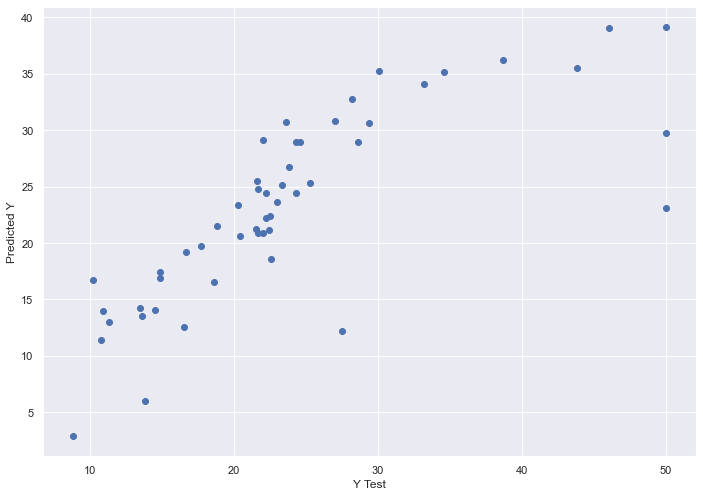

In [29]:
plt.scatter(Y_test,predictions)
plt.xlabel('Y Test')
plt.ylabel('Predicted Y')

In [30]:
Y_pred = lin_model.predict(X_test)
#printing th predicted values
Y_pred

array([12.20094754, 25.52743862, 19.72022769, 28.97261962, 22.23491262,
       23.11105467, 16.58349895, 16.7066239 , 13.04340435, 25.36113236,
       14.08255428, 28.96187664, 17.41516361, 35.12195152, 18.56609817,
       14.01120077, 13.55682928, 29.13454549, 23.34131123, 24.81784341,
       24.46855797, 36.23736417, 30.81467331, 19.23362136, 20.91334461,
       16.90913786, 11.43795382, 24.41540338, 30.77054121, 23.67994784,
       21.27331929,  6.03189162, 29.79077783, 35.48362417, 21.17582557,
       32.80207065, 35.20494347, 20.58760777, 28.97070075, 39.12885595,
       39.02124698, 12.52947717, 21.52155527, 25.10080091,  2.91629967,
       14.20862353, 22.36629766, 34.13036556, 26.76392353, 20.91953376,
       30.65175722])

In [31]:
bos_result = pd.DataFrame({'Actual' : Y_test, 'Predicted' : Y_pred})
bos_result.head(10)

,Actual,Predicted
365,27.5,12.200948
313,21.6,25.527439
461,17.7,19.720228
158,24.3,28.972620
333,22.2,22.234913
372,50.0,23.111055
352,18.6,16.583499
379,10.2,16.706624
382,11.3,13.043404
42,25.3,25.361132


#### Evaluating model's prediction accuracy  

In [32]:
# Measuring model's RMSE

from sklearn.metrics import r2_score

# model evaluation for training set
y_train_predict = lin_model.predict(X_train)
rmse = (np.sqrt(mean_squared_error(Y_train, y_train_predict)))
r2 = r2_score(Y_train, y_train_predict)

print("The model performance for training set")
print("--------------------------------------")
print('RMSE is {}'.format(rmse))
print('R2 score is {}'.format(r2))
print("\n")

The model performance for training set
--------------------------------------
RMSE is 4.491908754795745
R2 score is 0.7544211385076529




In [33]:
# model evaluation for testing set
y_test_predict = lin_model.predict(X_test)
rmse = (np.sqrt(mean_squared_error(Y_test, y_test_predict)))
r2 = r2_score(Y_test, y_test_predict)

print("The model performance for testing set")
print("--------------------------------------")
print('RMSE is {}'.format(rmse))
print('R2 score is {}'.format(r2))

The model performance for testing set
--------------------------------------
RMSE is 6.39573664233795
R2 score is 0.6010827499871458


Text(0.5, 1.0, 'Actual Prices vs Predicted prices')

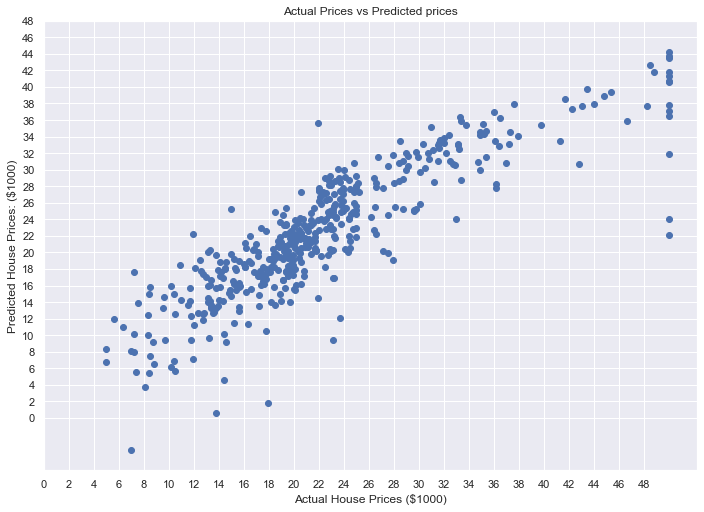

In [34]:
#viewing how model is predicting original prices and predicted prices 

plt.scatter(Y_train, y_train_predict)
plt.xlabel("Actual House Prices ($1000)")
plt.ylabel("Predicted House Prices: ($1000)")
plt.xticks(range(0, int(max(Y_train)),2))
plt.yticks(range(0, int(max(Y_train)),2))
plt.title("Actual Prices vs Predicted prices")

#### RMSE

In [35]:
from sklearn.metrics import mean_squared_error

housing_predictions = lin_model.predict(X)
lin_mse = mean_squared_error(Y, housing_predictions)
lin_rmse = np.sqrt(lin_mse)
lin_rmse

4.718733991894363

#### Decision tree model 

In [36]:
# Evaluating model on training set 
from sklearn.tree import DecisionTreeRegressor 

tree_reg = DecisionTreeRegressor()
tree_reg.fit(X, Y)


DecisionTreeRegressor()

In [37]:
housing_predictions = tree_reg.predict(X)

tree_mse = mean_squared_error(Y, housing_predictions)
tree_rmse = np.sqrt(tree_mse)
tree_rmse

0.0

In [38]:
# overfitting model?

 ## Better Evaluation Using Cross-Validation 

In [39]:
#fxn to display scores from cross-validation 
def display_scores(scores):
    print("Scores:", scores)
    print("Mean:", scores.mean())
    print("Standard deviation:", scores.std())


#### SKlearn's cross-validation feature 

In [40]:
#Evaluating decision tree model 

from sklearn.model_selection import cross_val_score
scores = cross_val_score(tree_reg, X, Y,
                             scoring="neg_mean_squared_error", cv=15)
tree_rmse_scores = np.sqrt(-scores)

display_scores(tree_rmse_scores)

Scores: [ 4.20531876  3.43635409  3.52607931  3.10772283  7.09363841  5.01544673
  4.69589934  6.51945054  4.17668599  3.85723156 12.3120577   9.88514343
  8.72507706  4.20638043  4.07876987]
Mean: 5.656083735655587
Standard deviation: 2.6309316122612416


In [41]:
#Evaluating linear regression model 
lin_scores = cross_val_score(lin_model, X, Y,
                                scoring="neg_mean_squared_error", cv=15)

lin_rmse_scores = np.sqrt(-lin_scores)

display_scores(lin_rmse_scores)

Scores: [ 3.30573778  3.31024623  3.49694217  2.26016408  6.19699115  5.17358002
  5.73362796  5.09430048  3.8861238   2.77555057 13.58618471  7.8084038
  5.71226626  2.94948693  3.72779142]
Mean: 5.001159825294764
Standard deviation: 2.7280116472495455


In [42]:
#Evaluating random forest model 

from sklearn.ensemble import RandomForestRegressor

forest_reg = RandomForestRegressor()
forest_reg.fit(X, Y)

forest_scores = cross_val_score(forest_reg, X, Y,
                               scoring="neg_mean_squared_error", cv=15)

forest_rmse_scores = np.sqrt(-forest_scores)
display_scores(forest_rmse_scores)

Scores: [ 3.27432888  2.02751493  2.57517619  1.28643297  4.49593219  4.51312207
  3.88486027  5.13838465  2.65969735  2.27263492 11.04000306  6.82637453
  5.68648435  2.38676107  4.24521969]
Mean: 4.154195140654113
Standard deviation: 2.3538589847053126


# 6. Fine Tune Model 

In [43]:
# Grid search - finding best combination of hyperparameter values

from sklearn.model_selection import GridSearchCV

param_grid = [
    {'n_estimators': [3, 7, 21, 30], 'max_features': [2, 4, 6]},
    {'bootstrap': [False], 'n_estimators': [3, 6, 10], 'max_features': [2, 3, 4]},
]

forest_reg = RandomForestRegressor()

grid_search = GridSearchCV(forest_reg, param_grid, cv=5,
                               scoring='neg_mean_squared_error')

grid_search.fit(X, Y)

GridSearchCV(cv=5, estimator=RandomForestRegressor(),
             param_grid=[{'max_features': [2, 4, 6],
                          'n_estimators': [3, 7, 21, 30]},
                         {'bootstrap': [False], 'max_features': [2, 3, 4],
                          'n_estimators': [3, 6, 10]}],
             scoring='neg_mean_squared_error')

In [44]:
#results from grid search 
grid_search.best_params_

{'max_features': 4, 'n_estimators': 30}

In [45]:
# directly getting best estimator 
grid_search.best_estimator_

RandomForestRegressor(max_features=4, n_estimators=30)

In [46]:
#evaluation scores 

cvres = grid_search.cv_results_

for mean_score, params in zip(cvres["mean_test_score"], cvres["params"]):
    print(np.sqrt(-mean_score), params)

6.842119921293727 {'max_features': 2, 'n_estimators': 3}
5.677468800407777 {'max_features': 2, 'n_estimators': 7}
5.170845260048503 {'max_features': 2, 'n_estimators': 21}
5.174832757181495 {'max_features': 2, 'n_estimators': 30}
6.511456180040669 {'max_features': 4, 'n_estimators': 3}
4.681755481992114 {'max_features': 4, 'n_estimators': 7}
4.548817569678021 {'max_features': 4, 'n_estimators': 21}
4.3415104200011525 {'max_features': 4, 'n_estimators': 30}
5.25599184646695 {'max_features': 6, 'n_estimators': 3}
4.880075062884216 {'max_features': 6, 'n_estimators': 7}
4.6297157265693665 {'max_features': 6, 'n_estimators': 21}
4.47238925672008 {'max_features': 6, 'n_estimators': 30}
5.997088972565722 {'bootstrap': False, 'max_features': 2, 'n_estimators': 3}
5.630163599188493 {'bootstrap': False, 'max_features': 2, 'n_estimators': 6}
5.5509381426250695 {'bootstrap': False, 'max_features': 2, 'n_estimators': 10}
5.576357313502561 {'bootstrap': False, 'max_features': 3, 'n_estimators': 3}


In [47]:
# importance of each attribute for making accurate predictions
feature_importances = grid_search.best_estimator_.feature_importances_
feature_importances

array([0.06660119, 0.00587774, 0.05533053, 0.00627434, 0.08300278,
       0.27312392, 0.02474993, 0.05005669, 0.0043065 , 0.04227901,
       0.05826068, 0.02472454, 0.30541215])

In [48]:
# importance scores next to corresponding attribute names
# LSTAT and RM most important features for prediction of median price of house. 

attributes = boston_dataset.feature_names
sorted(zip(feature_importances, attributes), reverse=True)

[(0.3054121497656594, 'LSTAT'),
 (0.27312391879942066, 'RM'),
 (0.08300277730475236, 'NOX'),
 (0.0666011911372026, 'CRIM'),
 (0.058260677082953856, 'PTRATIO'),
 (0.05533052912137046, 'INDUS'),
 (0.05005669312157432, 'DIS'),
 (0.042279009925577093, 'TAX'),
 (0.02474992680126908, 'AGE'),
 (0.024724544941241693, 'B'),
 (0.006274336624031805, 'CHAS'),
 (0.0058777412062316885, 'ZN'),
 (0.004306504168715033, 'RAD')]

#### Evaluating model on test set 

In [49]:
final_model = grid_search.best_estimator_

X_test_prepared = full_pipeline.transform(X_test)
final_predictions = final_model.predict(X_test_prepared)

final_mse = mean_squared_error(Y_test, final_predictions)
final_rmse = np.sqrt(final_mse)

final_rmse

12.952374139923785

## Results 

Predicted median house value in Boston are is 12.95. The features that had the most impact on the prediction were found to be % lower status of the population (LSTAT) and average number of rooms per house (RM). 